In [2]:
import obspy
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
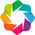

In [12]:
from display_utils import *

In [196]:
data=os.path.join(os.getcwd()+"/data")
seq_3=os.path.join(data+'/*1003.npy')
print(seq_3)
#print(glob.glob(seq_3+"/*.jp2")[0:100])
files=glob.glob(seq_3+"/*.npy")[500:501]
files

/mnt/batch/tasks/shared/LS_root/mounts/clusters/sn-lab-d13/code/Users/supanaesw/Seismic_noise_segmentation/data/*1003.npy


['/mnt/batch/tasks/shared/LS_root/mounts/clusters/sn-lab-d13/code/Users/supanaesw/Seismic_noise_segmentation/data/STP10-D1774P1003.npy/00001022.10.npy']

In [4]:
tr=np.load(files[0],allow_pickle=True)

In [5]:
def sinc_interp(x, s, u):
    """
    Interpolates x, sampled at "s" instants
    Output y is sampled at "u" instants ("u" for "upsampled")
    
    from Matlab:
    http://phaseportrait.blogspot.com/2008/06/sinc-interpolation-in-matlab.html        
    """
    
    if len(x) != len(s):
        raise Exception('x and s must be the same length')
    
    # Find the period    
    T = s[1] - s[0]
    
    sincM = np.tile(u, (len(s), 1)) - np.tile(s[:, np.newaxis], (1, len(u)))
    y = np.dot(x, np.sinc(sincM/T))
    return y

In [6]:
tr0=tr[:,0]
tr0.shape
s=np.linspace(0,5600,5601)
print(s,len(s))
u=np.linspace(0,11200,11201)
print(u,len(u))


[  0.00000000e+00   1.00000000e+00   2.00000000e+00 ...,   5.59800000e+03
   5.59900000e+03   5.60000000e+03] 5601
[  0.00000000e+00   1.00000000e+00   2.00000000e+00 ...,   1.11980000e+04
   1.11990000e+04   1.12000000e+04] 11201


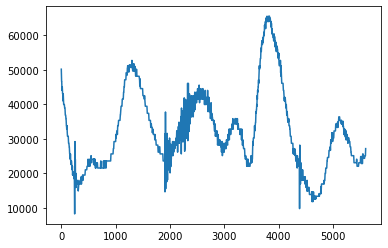

In [9]:
plt.plot(tr0)

In [20]:
from scipy.interpolate import interp1d,splrep

In [21]:
splrep?

In [11]:
f=interp1d(s,tr0)
f2=interp1d(s,tr0,kind='cubic')

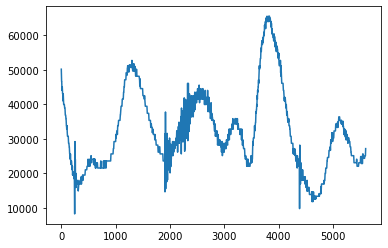

In [12]:
plt.plot(f(s))

[  0.00000000e+00   1.00001786e-01   2.00003571e-01 ...,   5.59980000e+03
   5.59990000e+03   5.60000000e+03] 56000


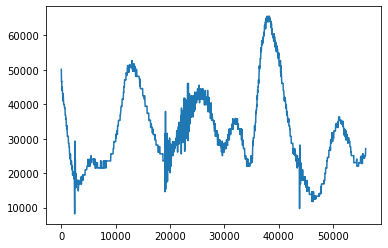

In [13]:
u=np.linspace(0,5600,56000)
print(u,len(u))

plt.plot(f2(u))

In [8]:
tr.shape

(5601, 648)

In [35]:
tr_finter=interp1d(s,tr,axis=0,kind="cubic")

In [48]:
u=np.linspace(0,5600,560000)
tr_inter=tr_finter(u)
tr_inter.shape

(560000, 648)

In [49]:
times=[t for t in range(0,tr_inter.shape[0])]
channels=[c for c in range(0,648)]


xr_arr=xr.Dataset(
        {
            'amplitudes':(('channels','time'),tr_inter.T)
        },
        {
            "channels":channels,"time":times
        }
    )
    

In [50]:
xr_arr

<xarray.Dataset>
Dimensions:     (channels: 648, time: 560000)
Coordinates:
  * channels    (channels) int64 0 1 2 3 4 5 6 7 ... 641 642 643 644 645 646 647
  * time        (time) int64 0 1 2 3 4 5 ... 559995 559996 559997 559998 559999
Data variables:
    amplitudes  (channels, time) float64 5.018e+04 5.017e+04 ... 3.2e+04 3.2e+04

In [ ]:
# tr_int=shot_display(data=tr_inter,time=times,channels=channels)
# datashade(tr_int)

In [15]:
from datashader import transfer_functions as tf, reductions as rd

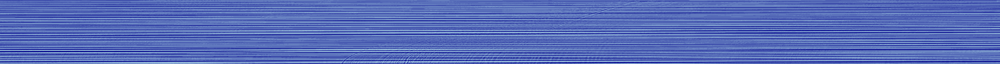

In [22]:
#tf.shade(xr_arr.amplitudes)

In [51]:
hvds=hv.Dataset(xr_arr)
hvds

:Dataset   [channels,time]   (amplitudes)

In [52]:
hvimage=hv.Image(hvds)

In [53]:
datashade(hvimage,cmap=hv.Palette.colormaps["grayscale"]).opts(invert_yaxis=True,height=1000,width=1000)

:DynamicMap   []
   :RGB   [channels,time]   (R,G,B,A)

In [ ]:
times=[t for t in range(0,tr.shape[0])]
channels=[c for c in range(0,648)]


xr_arr_orig=xr.Dataset(
        {
            'amplitudes':(('channels','time'),tr.T)
        },
        {
            "channels":channels,"time":times
        }
    )
orim=hv.Dataset(xr_arr_orig)
hvorim=hv.Image(orim)
#datashade(hvorim).opts(invert_yaxis=True,height=1000,width=1000,colorbar=True)

In [33]:
datashade(hvorim,cmap=hv.Palette.colormaps["grayscale"]).opts(invert_yaxis=True,height=1000,width=1000)

:DynamicMap   []
   :RGB   [channels,time]   (R,G,B,A)

In [28]:
hv.Palette.colormaps.keys()

dict_keys(['grayscale', 'YlGn', 'YlGnBu', 'GnBu', 'BuGn', 'PuBuGn', 'PuBu', 'BuPu', 'RdPu', 'PuRd', 'OrRd', 'YlOrRd', 'YlOrBr', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds', 'Greys', 'PuOr', 'BrBG', 'PRGn', 'PiYG', 'RdBu', 'RdGy', 'RdYlBu', 'Spectral', 'RdYlGn', 'Accent', 'Dark2', 'Paired', 'Pastel1', 'Pastel2', 'Set1', 'Set2', 'Set3', 'Category10', 'Category20', 'Category20b', 'Category20c', 'Colorblind', 'Magma', 'Inferno', 'Plasma', 'Viridis', 'Cividis', 'Turbo'])

In [32]:
hv.Palette.colormaps["grayscale"]

<function holoviews.core.options.grayscale(val)>

In [55]:
gdata=np.load('gain_data_f64.npy',allow_pickle=True)

In [56]:
gdata.shape

(5601, 648)

In [58]:
times=[t for t in range(0,gdata.shape[0])]
channels=[c for c in range(0,648)]


xarr_gdata=xr.Dataset(
        {
            'amplitudes':(('channels','time'),gdata.T)
        },
        {
            "channels":channels,"time":times
        }
    )

In [59]:
gain_hv_ds=hv.Dataset(xarr_gdata)
hvgain=hv.Image(gain_hv_ds)

In [131]:
%time
datashade(hvgain,cmap=hv.Palette.colormaps["grayscale"],interpolation="linear").opts(invert_yaxis=True,height=1000,width=1000)

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 6.2 µs


:DynamicMap   []
   :RGB   [channels,time]   (R,G,B,A)

In [61]:
from scipy.interpolate import RectBivariateSpline

In [81]:
x=np.linspace(0,100,101)
y=np.linspace(0,100,101)
print(x.shape,y.shape)
xx,yy=np.meshgrid(x,y)
z=xx**2+yy**2
#plt.plot(z)
print(z.shape)
#bbox=[min(x,tx),max(x,tx), min(y,ty),max(y,ty)].
bbox=[0,2000,0,2000]
rectBiVarF=RectBivariateSpline(x,y,z,bbox=bbox)

(101,) (101,)
(101, 101)


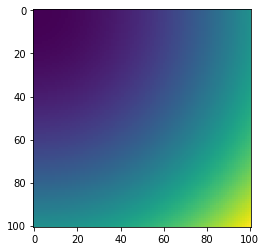

In [82]:
plt.imshow(z)

In [83]:
type(rectBiVarF)

scipy.interpolate.fitpack2.RectBivariateSpline

In [84]:
x_new=np.linspace(0,100,2000)
y_new=np.linspace(0,100,2000)

z_new=rectBiVarF(x_new,y_new)

In [85]:
z_new.shape

(2000, 2000)

In [86]:
z.shape

(101, 101)

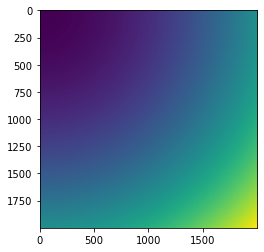

In [87]:
plt.imshow(z_new)

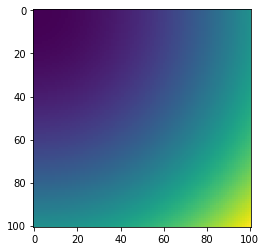

In [88]:
plt.imshow(z)

In [89]:
gdata.shape

(5601, 648)

In [113]:
xarr_gdata

<xarray.Dataset>
Dimensions:     (channels: 648, time: 5601)
Coordinates:
  * channels    (channels) int64 0 1 2 3 4 5 6 7 ... 641 642 643 644 645 646 647
  * time        (time) int64 0 1 2 3 4 5 6 ... 5595 5596 5597 5598 5599 5600
Data variables:
    amplitudes  (channels, time) float64 0.0 0.1202 ... -8.778e+04 -8.832e+04

In [125]:
bbox=[0,3240,0,28000]

In [126]:
xarr_gdata.amplitudes.shape

(648, 5601)

In [1]:
rectBiVarF=RectBivariateSpline(x=xarr_gdata.channels,y=xarr_gdata.time,z=xarr_gdata.amplitudes,bbox=bbox)

NameError: name 'RectBivariateSpline' is not defined

In [116]:
#mouse event capture?
channel_new=np.linspace(0,648,3240)
times_new=np.linspace(0,5600,28000)

In [117]:
gain_int_amplitudes=rectBiVarF(channel_new,times_new)

In [118]:
gain_int_amplitudes.shape

(3240, 28000)

In [120]:
times=[t for t in range(0,gain_int_amplitudes.shape[1])]
channels=[c for c in range(0,gain_int_amplitudes.shape[0])]


xarr_gdata_int=xr.Dataset(
        {
            'amplitudes':(('channels','time'),gain_int_amplitudes)
        },
        {
            "channels":channels,"time":times
        }
    )

In [148]:
xarr_gdata_int[:100,:100]

TypeError: unhashable type: 'slice'

In [150]:
hvds_gain_int=hv.Dataset(xarr_gdata_int)

In [152]:
hvds_gain_int

:Dataset   [channels,time]   (amplitudes)

In [153]:
hvimage_gain_int=hv.Image(hvds_gain_int.select(channels=(100,200),time=(1000,4000)))
%time
datashade(hvimage_gain_int,cmap=hv.Palette.colormaps["grayscale"]).opts(invert_yaxis=True,height=1000,width=1000)

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 6.2 µs


:DynamicMap   []
   :RGB   [channels,time]   (R,G,B,A)

In [132]:
#Event capturing
#http://holoviews.org/user_guide/Custom_Interactivity.html

In [140]:
from holoviews import streams

In [141]:
from holoviews.streams import Stream
ls = np.linspace(0, 10, 200)
xx, yy = np.meshgrid(ls, ls)
z=xx**2+yy**2

X = Stream.define('X',x=0.0)
Y = Stream.define('Y',y=0.0)
def marker(x,y):
    return hv.VLine(x) * hv.HLine(y)


dmap=hv.DynamicMap(marker,streams=[X(),Y()])
dmap

:DynamicMap   []
   :Overlay
      .VLine.I :VLine   [x,y]
      .HLine.I :HLine   [x,y]

In [143]:
dmap.event(x=0.3,y=0.4)

In [146]:
datashade(hvimage_gain_int,cmap=hv.Palette.colormaps["grayscale"]).opts(invert_yaxis=True,height=1000,width=1000) * dmap

:DynamicMap   []
   :Overlay
      .RGB.I   :RGB   [channels,time]   (R,G,B,A)
      .VLine.I :VLine   [x,y]
      .HLine.I :HLine   [x,y]

In [198]:
dmap.event(x=1600,y=10000)

In [154]:
hvimage_gain_int=hv.Image(hvds_gain_int.select(channels=(100,200),time=(1000,4000)))
def load_interpolate_return(data,chan_range,time_range):
    """
    return chunk of data given by chan_range[0],chan_range[1],time_range[0],time_range[1]
    """
    return data.select(channels=chan_range,time=time_range)
    
    
    
    

In [155]:
hvds_gain_int.select(channels=(100,200),time=(1000,4000))

:Dataset   [channels,time]   (amplitudes)

In [179]:
hvds_gain_int.

Dimension('time')

In [204]:
def area_of_interest(x_selection=(0,648),y_selection=(0,5600),bounds=(0,648,0,5600),data=hvds_gain_int):
#     print(x_selection,y_selection,bounds)
#     if x_selection is not None and y_selection is not None and bounds is not None:
#         return hv.Image(load_interpolate_return(data,chan_range=x_selection,time_range=y_selection))
#     else:
#         return hv.Image(data)#opts(invert_yaxis=True,height=1000,width=1000)
    if x_selection is None :
        x_selection=(0,100)
    if y_selection is None :
        y_selection=(0,100)
    if bounds is None :
        bounds=[0,100,0,100]
    
    return hv.Points([x_selection[0],y_selection[0]])
    #return 
    

In [209]:
selection=streams.SelectionXY()
print(selection.source)

None


In [206]:
selection_dmap=hv.DynamicMap(area_of_interest,streams=[selection])
selection_dmap

:DynamicMap   []
   :Points   [x,y]

In [207]:
datashade(hvimage_gain_int,cmap=hv.Palette.colormaps["grayscale"]).opts(invert_yaxis=True,height=1000,width=1000) *selection_dmap

:DynamicMap   []
   :Overlay
      .RGB.I    :RGB   [channels,time]   (R,G,B,A)
      .Points.I :Points   [x,y]

In [200]:
dmap.event(x=150,y=2500)

In [232]:
ls = np.linspace(0, 10, 200)
xx, yy = np.meshgrid(ls, ls)

XY = Stream.define('XY',x=0.0,y=0.0)

def marker(x_selection,y_selection,bounds):
    if x_selection is None:
        x_selection=(0,10)
    if y_selection is None:
        y_selection=(0,10)
    if bounds is None:
        bounds=(0,10,0,10)
    
    print(x_selection,y_selection,bounds)
    x_centre=(x_selection[0]-x_selection[1])/2
    y_centre=(y_selection[0]-y_selection[1])/2
    size=0.25
    return hv.Bounds(bounds)

image = hv.Image(xx*3+yy**3)

dmap = hv.DynamicMap(marker, streams=[selection])

image * dmap

(-0.38, -0.36) (0, 10) (-0.355, -0.335, -0.4, 0.2)


:DynamicMap   []
   :Overlay
      .Image.I  :Image   [x,y]   (z)
      .Bounds.I :Bounds   [x,y]

In [226]:
print(selection.source)

:DynamicMap   []


In [227]:
def subscriber(x_selection,y_selection,bounds):
    print("Subscriber received: ",x_selection,y_selection,bounds)
    
selection.add_subscriber(subscriber)

In [229]:
selection.event(bounds=(-0.355,-0.335,-0.4,0.2))

Subscriber received:  None None (-0.355, -0.335, -0.4, 0.2)
Subscriber received:  None None (-0.355, -0.335, -0.4, 0.2)
(0, 100) (0, 100) (-0.355, -0.335, -0.4, 0.2)
(0, 100) (0, 100) (-0.355, -0.335, -0.4, 0.2)
(0, 100) (0, 100) (-0.355, -0.335, -0.4, 0.2)
(0, 100) (0, 100) (-0.355, -0.335, -0.4, 0.2)
(0, 100) (0, 100) (-0.355, -0.335, -0.4, 0.2)


In [231]:
selection.event(x_selection=(-0.38,-0.36))

Subscriber received:  (-0.38, -0.36) None (-0.355, -0.335, -0.4, 0.2)
Subscriber received:  (-0.38, -0.36) None (-0.355, -0.335, -0.4, 0.2)
(-0.38, -0.36) (0, 100) (-0.355, -0.335, -0.4, 0.2)
(-0.38, -0.36) (0, 100) (-0.355, -0.335, -0.4, 0.2)
(-0.38, -0.36) (0, 100) (-0.355, -0.335, -0.4, 0.2)
(-0.38, -0.36) (0, 100) (-0.355, -0.335, -0.4, 0.2)
(-0.38, -0.36) (0, 100) (-0.355, -0.335, -0.4, 0.2)


In [239]:
boundsxy=streams.BoundsXY()

def rect(bounds):
    if bounds is None:
        bounds=()
    print(bounds)
    return hv.Bounds(lbrt=bounds)

def rect_sub(bounds):
    print("RectSubscriber: ",bounds)
    
boundsxy.add_subscriber(rect_sub)

In [240]:
image=hv.Image(xx**2+yy**2)

rect_dmap=hv.DynamicMap(rect,streams=[boundsxy])

In [241]:
image*rect_dmap

Invoked as rect(bounds=None)


None


TypeError: bad operand type for unary -: 'NoneType'

:DynamicMap   []